<a href="https://colab.research.google.com/github/kashishthakur26/Computer-vision-learning/blob/main/style_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
tf.__version__

'2.12.0'

## Laoding the pre-trained convolution neural network

In [2]:
network = tf.keras.applications.VGG19(include_top=False , weights = 'imagenet')

80134624/80134624 [==============================] - 0s 0us/step


## Loading and pre processing the images

In [3]:
import zipfile
zipfile = zipfile.ZipFile('/content/drive/MyDrive/Colab-notebooks/Images-20230705T053212Z-001.zip','r')
zipfile.extractall()
zipfile.close()

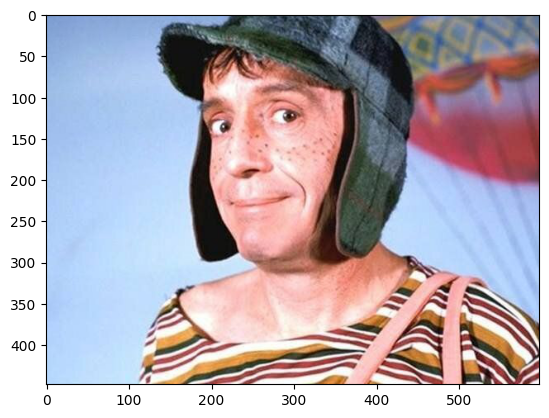

In [4]:
content_image = tf.keras.preprocessing.image.load_img('/content/Images/chaves.jpeg')
plt.imshow(content_image)

In [5]:
content_image = tf.keras.preprocessing.image.img_to_array(content_image)

In [6]:
type(content_image), content_image.shape, content_image.min(), content_image.max()

(numpy.ndarray, (448, 598, 3), 0.0, 255.0)

In [7]:
content_image = content_image / 255

In [8]:
content_image.min(), content_image.max()

(0.0, 1.0)

In [9]:
content_image

array([[[0.47843137, 0.6039216 , 0.8039216 ],
        [0.47843137, 0.6039216 , 0.8039216 ],
        [0.47843137, 0.6039216 , 0.8039216 ],
        ...,
        [0.38039216, 0.4627451 , 0.54509807],
        [0.38039216, 0.4627451 , 0.54509807],
        [0.38039216, 0.4627451 , 0.54509807]],

       [[0.4862745 , 0.6117647 , 0.8117647 ],
        [0.4862745 , 0.6117647 , 0.8117647 ],
        [0.4862745 , 0.6117647 , 0.8117647 ],
        ...,
        [0.3882353 , 0.46666667, 0.56078434],
        [0.3882353 , 0.46666667, 0.56078434],
        [0.3882353 , 0.46666667, 0.56078434]],

       [[0.49019608, 0.6156863 , 0.8156863 ],
        [0.49019608, 0.6156863 , 0.8156863 ],
        [0.49019608, 0.6156863 , 0.8156863 ],
        ...,
        [0.39215687, 0.47058824, 0.5686275 ],
        [0.39215687, 0.47058824, 0.5686275 ],
        [0.39215687, 0.47058824, 0.5686275 ]],

       ...,

       [[0.7294118 , 0.8627451 , 1.        ],
        [0.7254902 , 0.85882354, 1.        ],
        [0.7254902 , 0

## Style image

In [10]:
style_image = tf.keras.preprocessing.image.load_img('/content/Images/tarsila_amaral.jpg')

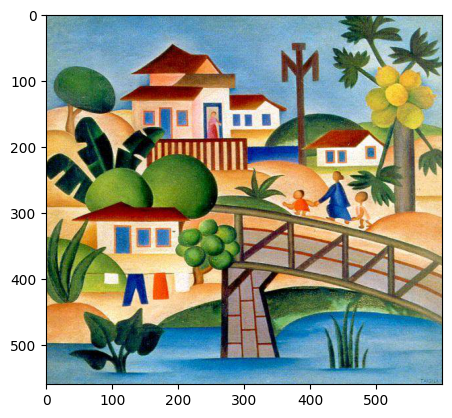

In [11]:
plt.imshow(style_image)

In [12]:
style_image = tf.keras.preprocessing.image.img_to_array(style_image)
style_image = style_image/255
style_image = style_image[tf.newaxis, :]
style_image.shape

(1, 560, 600, 3)

## Building the neural network

In [13]:
network.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [41]:
content_layers = ['block4_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

In [42]:
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)
print(num_content_layers, num_style_layers)

1 5


In [14]:
def vgg_layers(layer_names):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]
  network = tf.keras.Model(inputs = [vgg.input], outputs = outputs)

  return network

In [18]:
style_extractor = vgg_layers(style_layers)

In [19]:
style_extractor.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [20]:
style_outputs = style_extractor(style_image)

In [21]:
def gram_matrix(layer_activation):
  result = tf.linalg.einsum('bijc,bijd->bcd', layer_activation, layer_activation)
  input_shape = tf.shape(layer_activation)
  num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)

  return result / num_locations

In [22]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super().__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    inputs = inputs * 255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs = outputs[:self.num_style_layers]
    content_outputs = outputs[self.num_style_layers:]

    style_outputs = [gram_matrix(style_output) for style_output in style_outputs]

    content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
    style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [23]:
extractor = StyleContentModel(style_layers, content_layers)

In [27]:
content_image = tf.expand_dims(content_image , axis=0)

In [28]:
results = extractor(content_image)

In [29]:
results

{'content': {'block4_conv2': <tf.Tensor: shape=(1, 56, 74, 512), dtype=float32, numpy=
  array([[[[  17.105839,    0.      ,    0.      , ...,  574.59796 ,
               0.      ,    0.      ],
           [   0.      ,    0.      ,    0.      , ...,  291.41885 ,
             132.35033 ,    0.      ],
           [   0.      ,    0.      ,    0.      , ...,  332.05222 ,
             118.952034,    0.      ],
           ...,
           [ 700.125   ,    0.      ,    0.      , ..., 1511.4629  ,
              11.206578,  325.4834  ],
           [ 141.86774 ,    0.      ,    0.      , ..., 1099.7539  ,
              96.57442 ,  195.72563 ],
           [ 137.43665 ,    0.      ,    0.      , ...,  469.2027  ,
             180.22139 ,  676.20026 ]],
  
          [[   0.      ,    0.      ,    0.      , ...,  549.103   ,
               0.      ,    0.      ],
           [   0.      ,    0.      ,    0.      , ...,   44.16062 ,
               0.      ,    0.      ],
           [   0.      ,    0

In [30]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [31]:
new_image = tf.Variable(content_image)

In [32]:
content_weight = 1
style_weight = 100

In [33]:
optimizer = tf.optimizers.Adam(learning_rate=0.02)

## Training

In [34]:
expected_output = np.array([10000, 15000])
predictions = np.array([8000, 15900])

In [35]:
np.sum(abs(expected_output - predictions)) / 2

1450.0

In [36]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [37]:
mean_absolute_error(expected_output, predictions)

1450.0

In [38]:
mean_squared_error(expected_output, predictions)

2405000.0

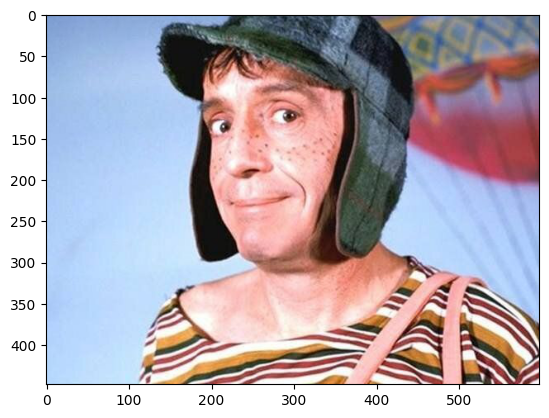

In [39]:
plt.imshow(tf.squeeze(content_image, axis = 0));

Epoch 500 | content loss: 616826.625 | style loss: 281465440.0 | total loss 5629925888.0


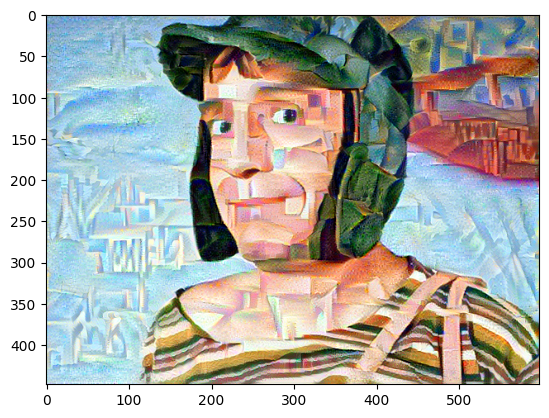

Epoch 1000 | content loss: 652114.1875 | style loss: 103517464.0 | total loss 2071001344.0


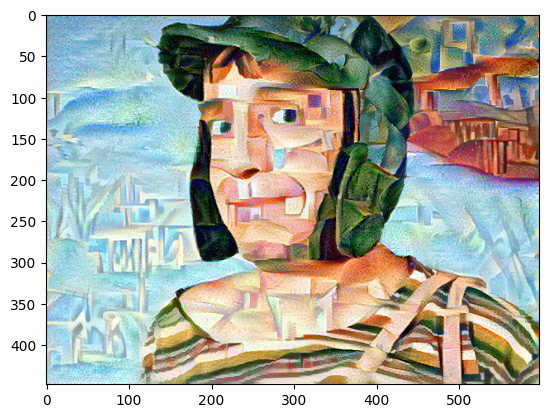

Epoch 1500 | content loss: 671771.0625 | style loss: 77502528.0 | total loss 1550722304.0


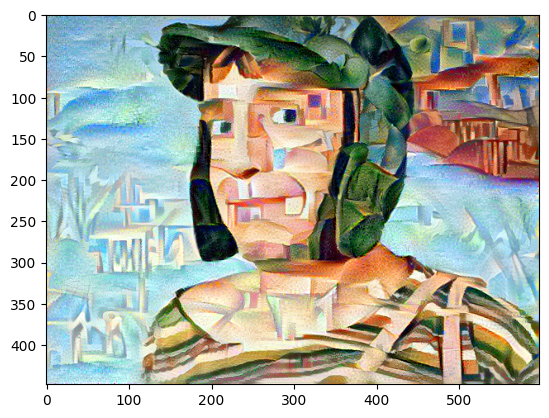

Epoch 2000 | content loss: 683040.5 | style loss: 186817936.0 | total loss 3737041920.0


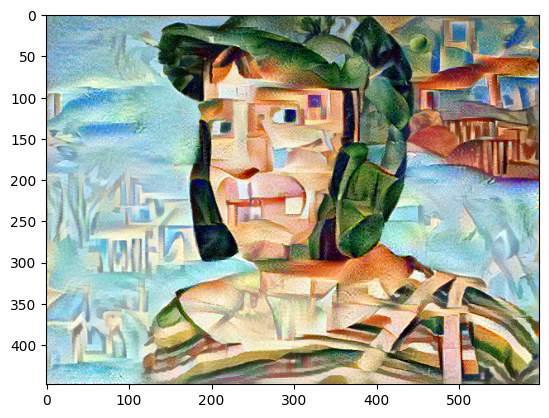

Epoch 2500 | content loss: 699649.0625 | style loss: 59545840.0 | total loss 1191616512.0


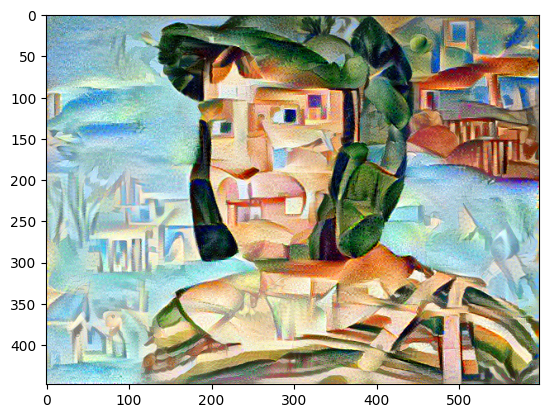

Epoch 3000 | content loss: 700680.125 | style loss: 124616328.0 | total loss 2493027072.0


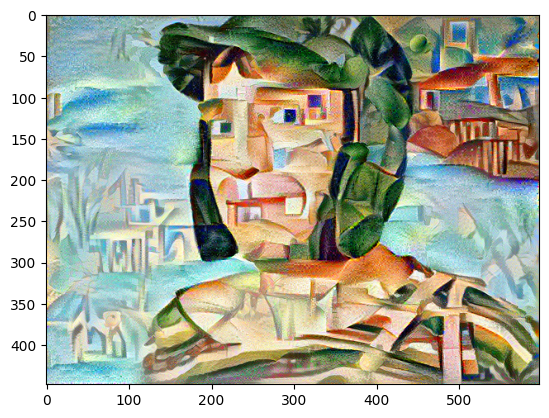

In [43]:
epochs = 3000
print_every = 500

for epoch in range(epochs):
  with tf.GradientTape() as tape:
    outputs = extractor(new_image)

    content_outputs = outputs['content']
    style_outputs = outputs['style']

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2) for name in content_outputs.keys()])
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2) for name in style_outputs.keys()])

    total_loss = content_loss * content_weight / num_content_layers + style_loss * style_weight / num_style_layers

  gradient = tape.gradient(total_loss, new_image)
  optimizer.apply_gradients([(gradient, new_image)])

  new_image.assign(tf.clip_by_value(new_image, 0.0, 1.0))

  if (epoch + 1) % print_every == 0:
    print('Epoch {} | content loss: {} | style loss: {} | total loss {}'.format(epoch + 1, content_loss, style_loss, total_loss))
    plt.imshow(tf.squeeze(new_image, axis = 0))
    plt.show()

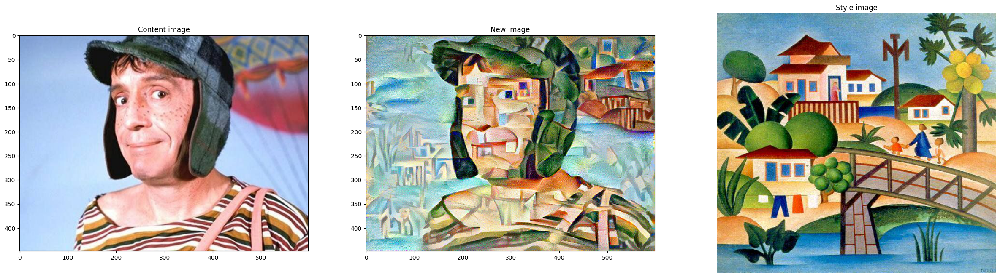

In [44]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,8))
ax1.imshow(tf.squeeze(content_image, axis = 0))
ax1.set_title('Content image')
ax2.imshow(tf.squeeze(new_image, axis = 0))
ax2.set_title('New image')
ax3.imshow(tf.squeeze(style_image, axis = 0))
ax3.set_title('Style image')
plt.axis('off');

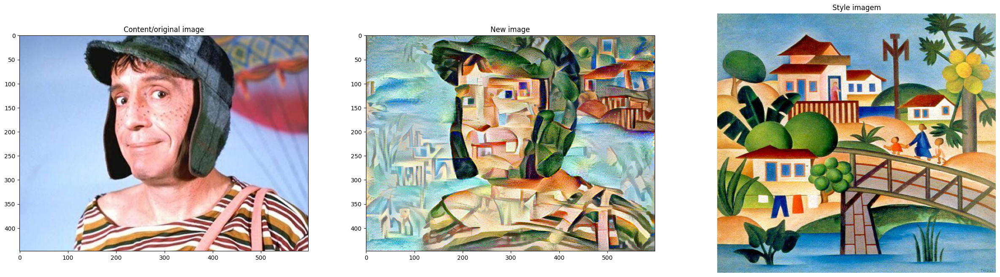

In [45]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 8))
ax1.imshow(tf.squeeze(content_image, axis = 0))
ax1.set_title('Content/original image')
ax2.imshow(tf.squeeze(new_image, axis = 0))
ax2.set_title('New image')
ax3.imshow(tf.squeeze(style_image, axis = 0))
ax3.set_title('Style imagem')
plt.axis('off');